In [1]:
#import libraties
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix
import warnings

In [2]:
Train_data = pd.read_csv("../input/train-mobile-dataset/train.csv")
Train_data

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,...,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,...,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,...,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,1208,1212,1411,8,2,15,1,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,794,1,0.5,1,0,1,2,0.8,106,6,...,1222,1890,668,13,4,19,1,1,0,0
1996,1965,1,2.6,1,0,0,39,0.2,187,4,...,915,1965,2032,11,10,16,1,1,1,2
1997,1911,0,0.9,1,1,1,36,0.7,108,8,...,868,1632,3057,9,1,5,1,1,0,3
1998,1512,0,0.9,0,4,1,46,0.1,145,5,...,336,670,869,18,10,19,1,1,1,0


## Data Information

battery_power: Total energy a battery can store in one time measured in mAH

blue: Has bluetooth or not

clock_speed: Speed at which microprocessor executes instructions

dual_sim: Has dual sim support or not

fc: Front camera mega pixels

four_g: Has 4G or not

int_memory: Internal Memory in Gigabytes

m_dep: Mobile Depth in cm

mobile_wt: Weight of mobile phone

n_cores: Number of cores of processor

pc: Primary camera mega pixels

px_height: Pixel Resolution Height

px_width: Pixel Resolution Width

ram: Random Access Memory in Mega Bytes

sc_h: Screen Height of mobile cm 

sc_w: Screen Weight of mobile cm

talk_time:Longest time that a single battery charge will last when you are

three_g: Has 3G or not

touch_screen: Has touch screen or not

wifi: Has wifi or not
price_range: This is the target variable with value of 0(Low Cost), 1(Medium Cost) 2(high cost)and 3(Very high cost)



## Applied Models:

Decision tree

Random forest

SVM

In [3]:
# Creat DataFrame
Mobile_df = pd.DataFrame(Train_data)

In [4]:
Mobile_df.describe(include = "all")

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
count,2000.000000,2000.0000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,...,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,1238.518500,0.4950,1.522250,0.509500,4.309500,0.521500,32.046500,0.501750,140.249000,4.520500,...,645.108000,1251.515500,2124.213000,12.306500,5.767000,11.011000,0.761500,0.503000,0.507000,1.500000
std,439.418206,0.5001,0.816004,0.500035,4.341444,0.499662,18.145715,0.288416,35.399655,2.287837,...,443.780811,432.199447,1084.732044,4.213245,4.356398,5.463955,0.426273,0.500116,0.500076,1.118314
min,501.000000,0.0000,0.500000,0.000000,0.000000,0.000000,2.000000,0.100000,80.000000,1.000000,...,0.000000,500.000000,256.000000,5.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000
25%,851.750000,0.0000,0.700000,0.000000,1.000000,0.000000,16.000000,0.200000,109.000000,3.000000,...,282.750000,874.750000,1207.500000,9.000000,2.000000,6.000000,1.000000,0.000000,0.000000,0.750000
50%,1226.000000,0.0000,1.500000,1.000000,3.000000,1.000000,32.000000,0.500000,141.000000,4.000000,...,564.000000,1247.000000,2146.500000,12.000000,5.000000,11.000000,1.000000,1.000000,1.000000,1.500000
75%,1615.250000,1.0000,2.200000,1.000000,7.000000,1.000000,48.000000,0.800000,170.000000,7.000000,...,947.250000,1633.000000,3064.500000,16.000000,9.000000,16.000000,1.000000,1.000000,1.000000,2.250000
max,1998.000000,1.0000,3.000000,1.000000,19.000000,1.000000,64.000000,1.000000,200.000000,8.000000,...,1960.000000,1998.000000,3998.000000,19.000000,18.000000,20.000000,1.000000,1.000000,1.000000,3.000000


## Data Visualization & Analysis

In [5]:
Mobile_df.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,...,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,...,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,...,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,1208,1212,1411,8,2,15,1,1,0,1


In [6]:
Mobile_df.shape

(2000, 21)

In [7]:
# Show detaile columns
Mobile_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   battery_power  2000 non-null   int64  
 1   blue           2000 non-null   int64  
 2   clock_speed    2000 non-null   float64
 3   dual_sim       2000 non-null   int64  
 4   fc             2000 non-null   int64  
 5   four_g         2000 non-null   int64  
 6   int_memory     2000 non-null   int64  
 7   m_dep          2000 non-null   float64
 8   mobile_wt      2000 non-null   int64  
 9   n_cores        2000 non-null   int64  
 10  pc             2000 non-null   int64  
 11  px_height      2000 non-null   int64  
 12  px_width       2000 non-null   int64  
 13  ram            2000 non-null   int64  
 14  sc_h           2000 non-null   int64  
 15  sc_w           2000 non-null   int64  
 16  talk_time      2000 non-null   int64  
 17  three_g        2000 non-null   int64  
 18  touch_sc

In [8]:
# How many missing value?
Mobile_df.isna().sum()

battery_power    0
blue             0
clock_speed      0
dual_sim         0
fc               0
four_g           0
int_memory       0
m_dep            0
mobile_wt        0
n_cores          0
pc               0
px_height        0
px_width         0
ram              0
sc_h             0
sc_w             0
talk_time        0
three_g          0
touch_screen     0
wifi             0
price_range      0
dtype: int64

### Descriptive Statistics


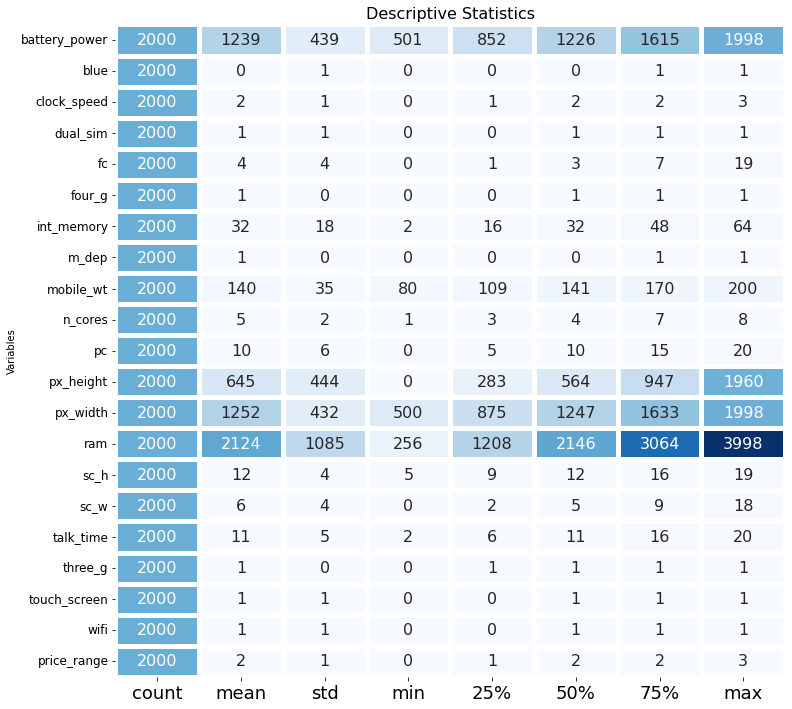

In [9]:
# Show detaile data set
desc = Mobile_df.describe().T
Mobile_df2 = pd.DataFrame(index=['battery_power', 'blue', 'clock_speed', 'dual_sim',
                          'fc', 'four_g', 'int_memory', 'm_dep', 'mobile_wt', 
                          'n_cores', 'pc', 'px_height', 'px_width', 'ram', 
                          'sc_h', 'sc_w', 'talk_time', 'three_g','touch_screen',
                          'wifi', 'price_range'], 
                   columns= ["count","mean","std","min",
                             "25%","50%","75%","max"], data= desc )

f,ax = plt.subplots(figsize=(12,12))

sns.heatmap(Mobile_df2, annot=True,cmap = "Blues", fmt= '.0f',
            ax=ax,linewidths = 5, cbar = False,
            annot_kws={"size": 16})

plt.xticks(size = 18)
plt.yticks(size = 12, rotation = 0)
plt.ylabel("Variables")
plt.title("Descriptive Statistics", size = 16)
plt.show()

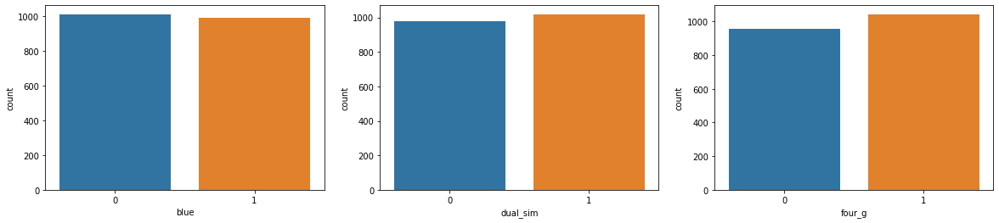

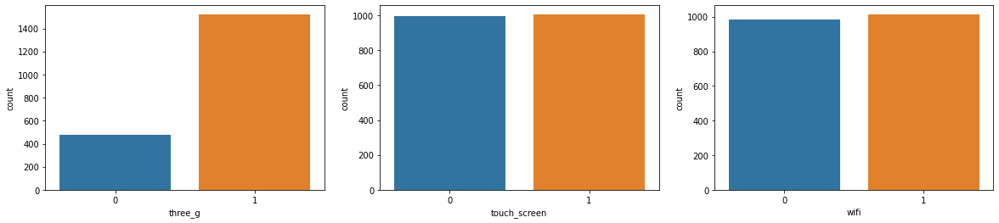

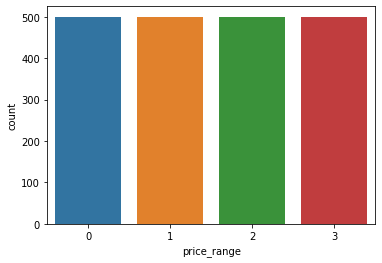

In [10]:
## plot for categorical columns
categorical = ["blue","dual_sim","four_g","three_g","touch_screen","wifi","price_range"]
i = 0
while i <8:
    fig = plt.figure(figsize =[20,4])
    plt.subplot(1,3,1)
    sns.countplot(x =categorical[i], data = Mobile_df )
    
    i+=1
    if i==7:
        break
    plt.subplot(1,3,2)
    sns.countplot(x =categorical[i], data = Mobile_df)
    i+=1
    plt.subplot(1,3,3)
    sns.countplot(x =categorical[i], data = Mobile_df)
    i+=1
    
    plt.show()

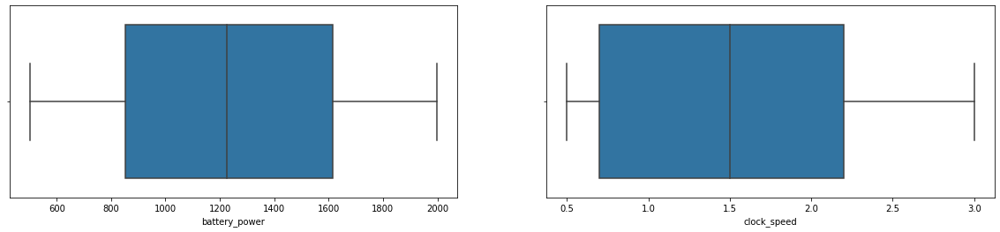

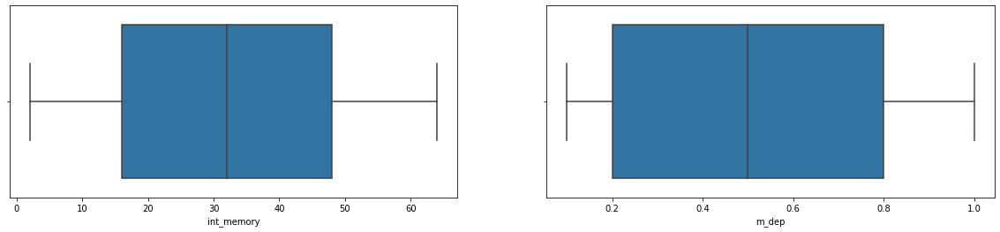

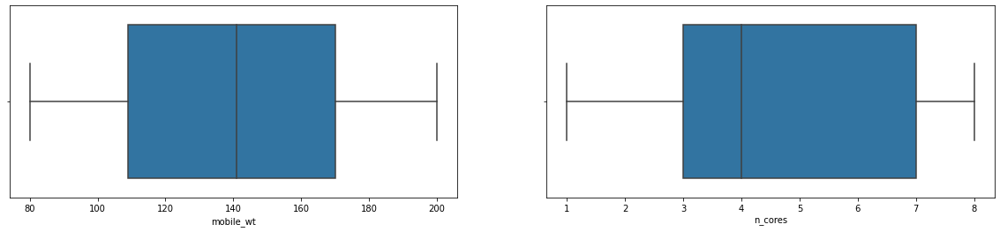

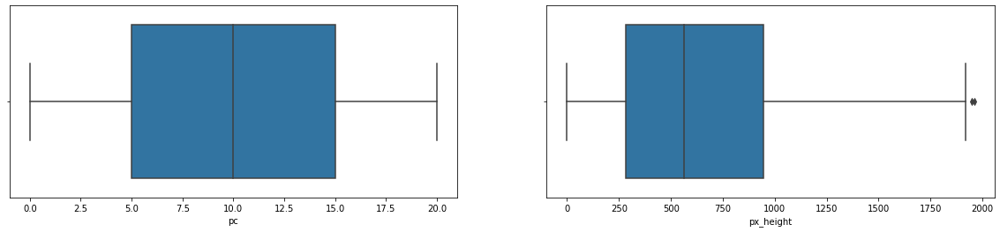

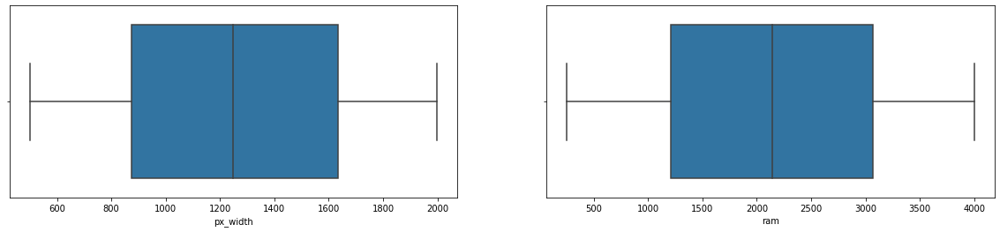

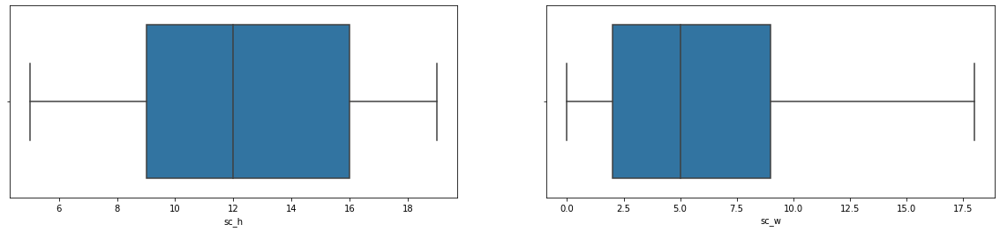

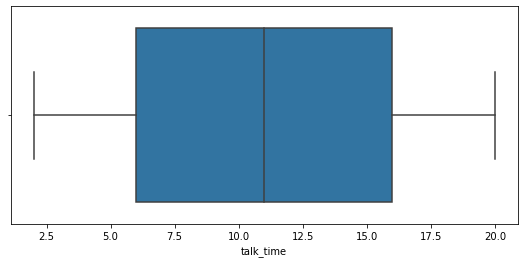

In [11]:
## plot for numerical columns
Numerical = ["battery_power","clock_speed","int_memory","m_dep","mobile_wt","n_cores","pc","px_height","px_width","ram","sc_h","sc_w","talk_time"]
i = 0
while i <13:
    fig = plt.figure(figsize =[20,4])
    plt.subplot(1,2,1)   #(one row, two plots, firs one)
    sns.boxplot(x =Numerical[i], data = Mobile_df )
    i+=1
    if i==13:
        break
    plt.subplot(1,2,2)
    sns.boxplot(x =Numerical[i], data = Mobile_df)
    i+=1
  
    plt.show()

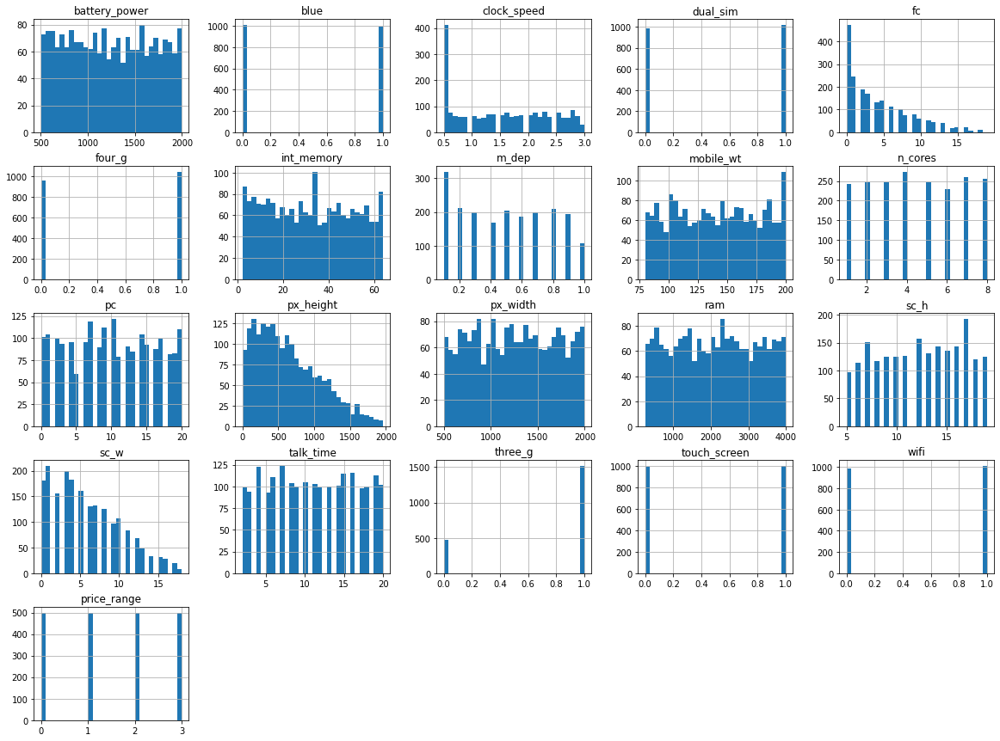

In [12]:
#histogram for all columns
Mobile_df.hist(bins=30,figsize=(20,15))
plt.show()

In [13]:
## Function to plot stacked bar chart
def stacked_plot(x):
    sns.set_palette(sns.color_palette("Set2", 8))
    tab1 = pd.crosstab(x,Mobile_df['price_range'],margins=True)
    print(tab1)
    print('-'*120)
    tab = pd.crosstab(x,Mobile_df['price_range'],normalize='index')
    tab.plot(kind='bar',stacked=True,figsize=(7,4))
    plt.xticks(rotation=360)
    labels=["No","Yes"]
    plt.legend(loc='lower left', frameon=False,)
    plt.legend(loc="upper left", labels=labels,title="Borrowed Loan",bbox_to_anchor=(1,1))
    sns.despine(top=True,right=True,left=True) # to remove side line from graph
    #plt.legend(labels)
    plt.show()

price_range    0    1    2    3   All
blue                                 
0            257  255  257  241  1010
1            243  245  243  259   990
All          500  500  500  500  2000
------------------------------------------------------------------------------------------------------------------------


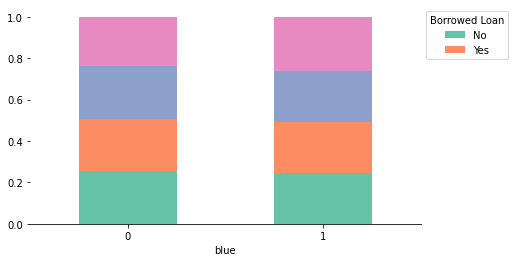

price_range    0    1    2    3   All
dual_sim                             
0            250  245  251  235   981
1            250  255  249  265  1019
All          500  500  500  500  2000
------------------------------------------------------------------------------------------------------------------------


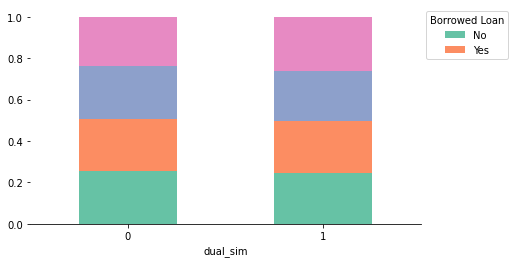

price_range    0    1    2    3   All
four_g                               
0            241  238  253  225   957
1            259  262  247  275  1043
All          500  500  500  500  2000
------------------------------------------------------------------------------------------------------------------------


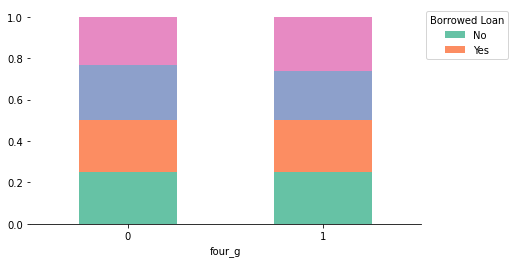

price_range    0    1    2    3   All
three_g                              
0            127  122  113  115   477
1            373  378  387  385  1523
All          500  500  500  500  2000
------------------------------------------------------------------------------------------------------------------------


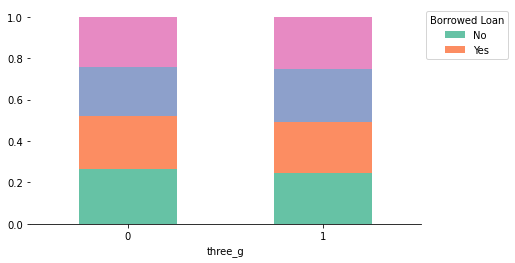

price_range     0    1    2    3   All
touch_screen                          
0             238  239  265  252   994
1             262  261  235  248  1006
All           500  500  500  500  2000
------------------------------------------------------------------------------------------------------------------------


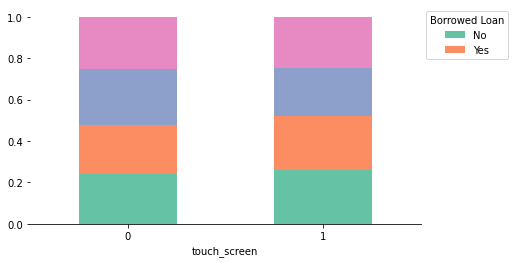

price_range    0    1    2    3   All
wifi                                 
0            252  248  248  238   986
1            248  252  252  262  1014
All          500  500  500  500  2000
------------------------------------------------------------------------------------------------------------------------


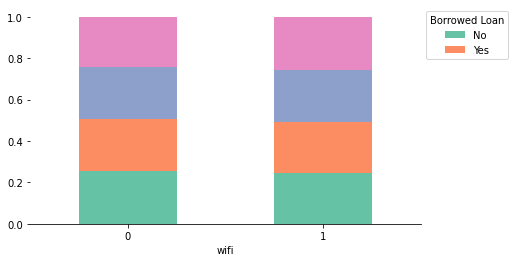

price_range    0    1    2    3   All
price_range                          
0            500    0    0    0   500
1              0  500    0    0   500
2              0    0  500    0   500
3              0    0    0  500   500
All          500  500  500  500  2000
------------------------------------------------------------------------------------------------------------------------


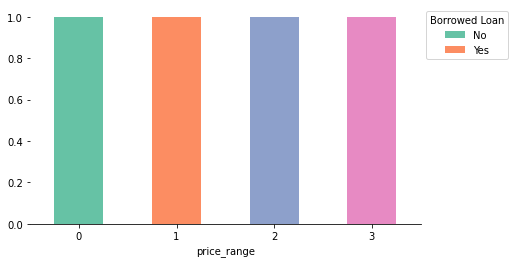

In [14]:
cat_columns=["blue","dual_sim","four_g","three_g","touch_screen","wifi","price_range"]
for i, variable in enumerate(cat_columns):
       stacked_plot(Mobile_df[variable])

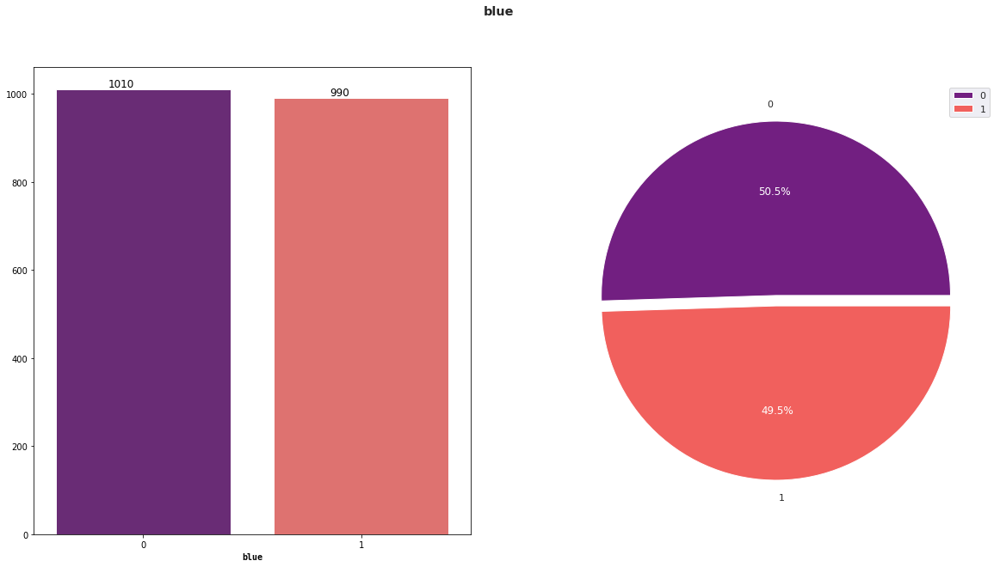

In [15]:
fig, ax = plt.subplots(1, 2, figsize=(20,10))
x=Mobile_df['blue'].value_counts().index
y=Mobile_df['blue'].value_counts().values.tolist()
data = Mobile_df.groupby("blue").size()
sns.set(style="dark", color_codes=True)
pal = sns.color_palette("magma", len(data))
rank = data.argsort().argsort() 
sns.barplot(x=x,y=y,palette=np.array(pal[::-1])[rank],ax = ax[0])
for p in ax[0].patches:
        ax[0].annotate('{:.0f}'.format(p.get_height()), (p.get_x()+0.3, p.get_height()),
                    ha='center', va='bottom',
                    color= 'black')
ax[0].set_xlabel('blue', weight='semibold', fontname = 'monospace')
_, _, autotexts= ax[1].pie(y, labels = x, colors = pal, autopct='%1.1f%%',
        explode=[0.03 for i in Mobile_df['blue'].value_counts().index])
for autotext in autotexts:
    autotext.set_color('white')
plt.legend(bbox_to_anchor=(1, 1))
plt.suptitle ('blue',weight = 'bold')
plt.show()

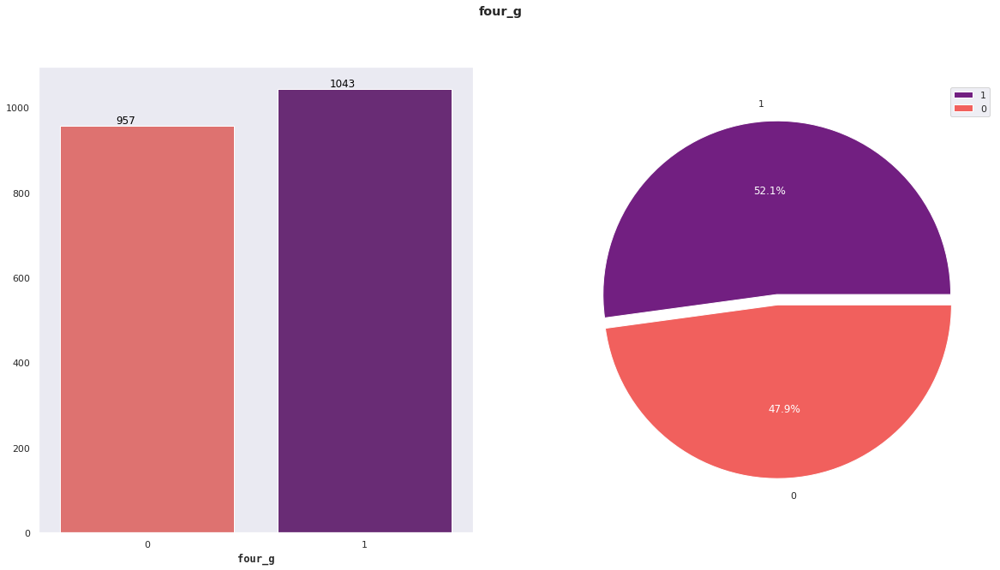

In [16]:
fig, ax = plt.subplots(1, 2, figsize=(20,10))
x=Mobile_df['four_g'].value_counts().index
y=Mobile_df['four_g'].value_counts().values.tolist()
data = Mobile_df.groupby("four_g").size()
sns.set(style="dark", color_codes=True)
pal = sns.color_palette("magma", len(data))
rank = data.argsort().argsort() 
sns.barplot(x=x,y=y,palette=np.array(pal[::-1])[rank],ax = ax[0])
for p in ax[0].patches:
        ax[0].annotate('{:.0f}'.format(p.get_height()), (p.get_x()+0.3, p.get_height()),
                    ha='center', va='bottom',
                    color= 'black')
ax[0].set_xlabel('four_g', weight='semibold', fontname = 'monospace')
_, _, autotexts= ax[1].pie(y, labels = x, colors = pal, autopct='%1.1f%%',
        explode=[0.03 for i in Mobile_df['blue'].value_counts().index])
for autotext in autotexts:
    autotext.set_color('white')
plt.legend(bbox_to_anchor=(1, 1))
plt.suptitle ('four_g',weight = 'bold')
plt.show()

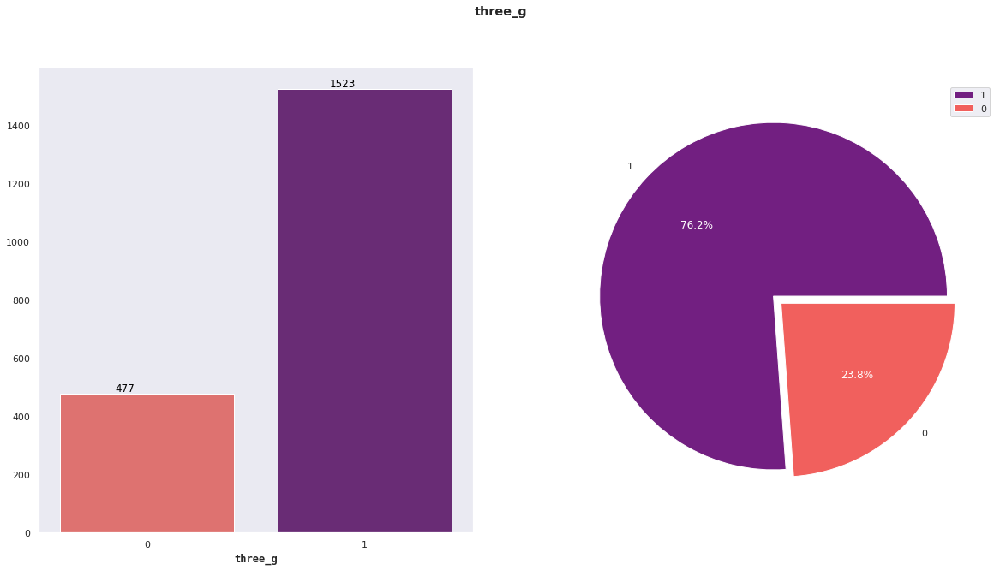

In [17]:
fig, ax = plt.subplots(1, 2, figsize=(20,10))
x=Mobile_df['three_g'].value_counts().index
y=Mobile_df['three_g'].value_counts().values.tolist()
data = Mobile_df.groupby("three_g").size()
sns.set(style="dark", color_codes=True)
pal = sns.color_palette("magma", len(data))
rank = data.argsort().argsort() 
sns.barplot(x=x,y=y,palette=np.array(pal[::-1])[rank],ax = ax[0])
for p in ax[0].patches:
        ax[0].annotate('{:.0f}'.format(p.get_height()), (p.get_x()+0.3, p.get_height()),
                    ha='center', va='bottom',
                    color= 'black')
ax[0].set_xlabel('three_g', weight='semibold', fontname = 'monospace')
_, _, autotexts= ax[1].pie(y, labels = x, colors = pal, autopct='%1.1f%%',
        explode=[0.03 for i in Mobile_df['blue'].value_counts().index])
for autotext in autotexts:
    autotext.set_color('white')
plt.legend(bbox_to_anchor=(1, 1))
plt.suptitle ('three_g',weight = 'bold')
plt.show()

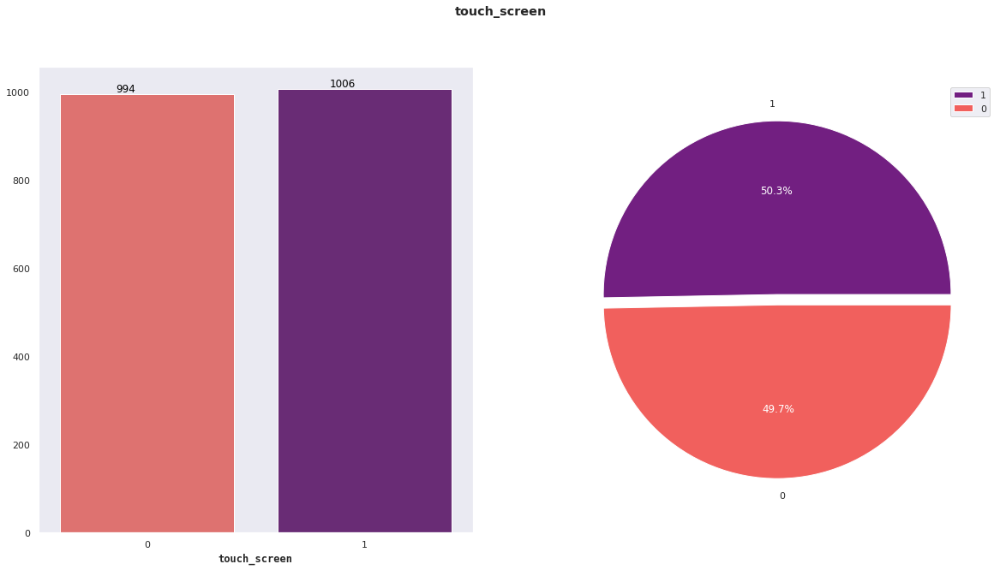

In [18]:
fig, ax = plt.subplots(1, 2, figsize=(20,10))
x=Mobile_df['touch_screen'].value_counts().index
y=Mobile_df['touch_screen'].value_counts().values.tolist()
data = Mobile_df.groupby("three_g").size()
sns.set(style="dark", color_codes=True)
pal = sns.color_palette("magma", len(data))
rank = data.argsort().argsort() 
sns.barplot(x=x,y=y,palette=np.array(pal[::-1])[rank],ax = ax[0])
for p in ax[0].patches:
        ax[0].annotate('{:.0f}'.format(p.get_height()), (p.get_x()+0.3, p.get_height()),
                    ha='center', va='bottom',
                    color= 'black')
ax[0].set_xlabel('touch_screen', weight='semibold', fontname = 'monospace')
_, _, autotexts= ax[1].pie(y, labels = x, colors = pal, autopct='%1.1f%%',
        explode=[0.03 for i in Mobile_df['blue'].value_counts().index])
for autotext in autotexts:
    autotext.set_color('white')
plt.legend(bbox_to_anchor=(1, 1))
plt.suptitle ('touch_screen',weight = 'bold')
plt.show()

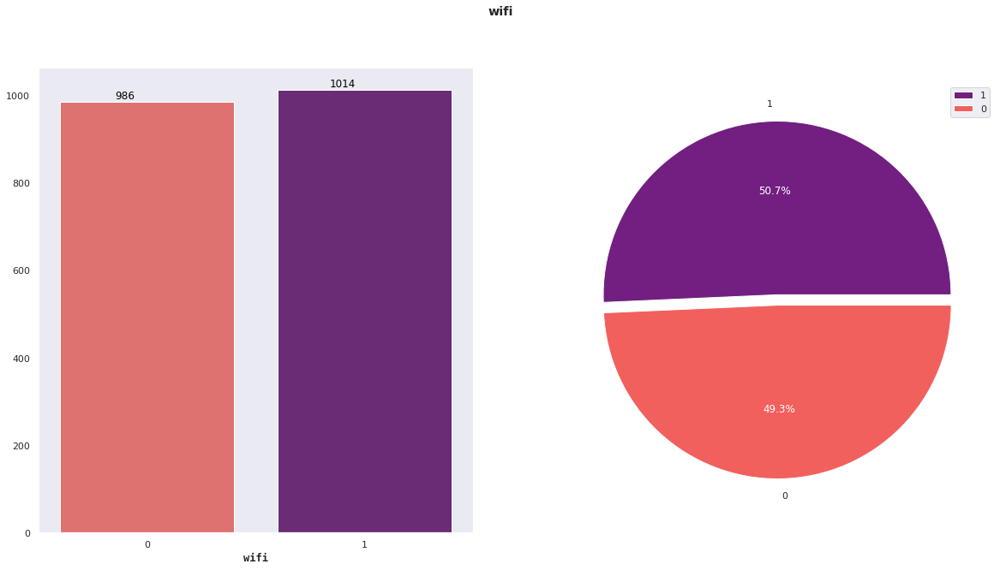

In [19]:
fig, ax = plt.subplots(1, 2, figsize=(20,10))
x=Mobile_df['wifi'].value_counts().index
y=Mobile_df['wifi'].value_counts().values.tolist()
data = Mobile_df.groupby("three_g").size()
sns.set(style="dark", color_codes=True)
pal = sns.color_palette("magma", len(data))
rank = data.argsort().argsort() 
sns.barplot(x=x,y=y,palette=np.array(pal[::-1])[rank],ax = ax[0])
for p in ax[0].patches:
        ax[0].annotate('{:.0f}'.format(p.get_height()), (p.get_x()+0.3, p.get_height()),
                    ha='center', va='bottom',
                    color= 'black')
ax[0].set_xlabel('wifi', weight='semibold', fontname = 'monospace')
_, _, autotexts= ax[1].pie(y, labels = x, colors = pal, autopct='%1.1f%%',
        explode=[0.03 for i in Mobile_df['three_g'].value_counts().index])
for autotext in autotexts:
    autotext.set_color('white')
plt.legend(bbox_to_anchor=(1, 1))
plt.suptitle ('wifi',weight = 'bold')
plt.show()

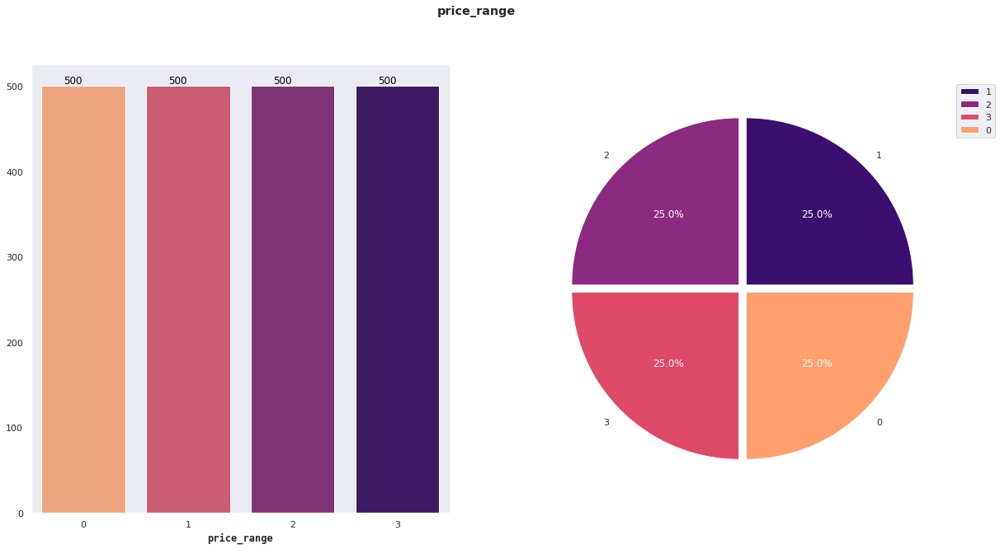

In [20]:
fig, ax = plt.subplots(1, 2, figsize=(20,10))
x=Mobile_df['price_range'].value_counts().index
y=Mobile_df['price_range'].value_counts().values.tolist()
data = Mobile_df.groupby("price_range").size()
sns.set(style="dark", color_codes=True)
pal = sns.color_palette("magma", len(data))
rank = data.argsort().argsort() 
sns.barplot(x=x,y=y,palette=np.array(pal[::-1])[rank],ax = ax[0])
for p in ax[0].patches:
        ax[0].annotate('{:.0f}'.format(p.get_height()), (p.get_x()+0.3, p.get_height()),
                    ha='center', va='bottom',
                    color= 'black')
ax[0].set_xlabel('price_range', weight='semibold', fontname = 'monospace')
_, _, autotexts= ax[1].pie(y, labels = x, colors = pal, autopct='%1.1f%%',
        explode=[0.03 for i in Mobile_df['price_range'].value_counts().index])
for autotext in autotexts:
    autotext.set_color('white')
plt.legend(bbox_to_anchor=(1, 1))
plt.suptitle ('price_range',weight = 'bold')
plt.show()

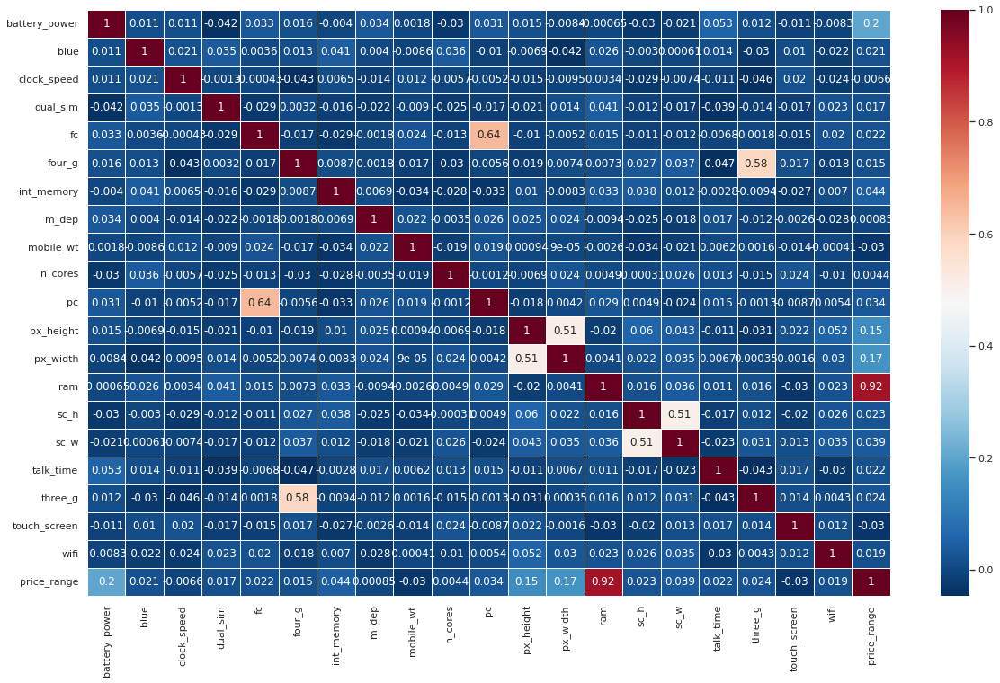

In [21]:
## Show correlation
fig, ax = plt.subplots(figsize = (20, 12)) #Size of plot
ax = sns.heatmap(Mobile_df.corr(),cmap='RdBu_r',cbar=True,annot=True,linewidths=0.5,ax=ax)
plt.show()

##  Best correlation for ram

In [22]:
#correlation
Mobile_df.corr()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
battery_power,1.000000,0.011252,0.011482,-0.041847,0.033334,0.015665,-0.004004,0.034085,0.001844,-0.029727,...,0.014901,-0.008402,-0.000653,-0.029959,-0.021421,0.052510,0.011522,-0.010516,-0.008343,0.200723
blue,0.011252,1.000000,0.021419,0.035198,0.003593,0.013443,0.041177,0.004049,-0.008605,0.036161,...,-0.006872,-0.041533,0.026351,-0.002952,0.000613,0.013934,-0.030236,0.010061,-0.021863,0.020573
clock_speed,0.011482,0.021419,1.000000,-0.001315,-0.000434,-0.043073,0.006545,-0.014364,0.012350,-0.005724,...,-0.014523,-0.009476,0.003443,-0.029078,-0.007378,-0.011432,-0.046433,0.019756,-0.024471,-0.006606
dual_sim,-0.041847,0.035198,-0.001315,1.000000,-0.029123,0.003187,-0.015679,-0.022142,-0.008979,-0.024658,...,-0.020875,0.014291,0.041072,-0.011949,-0.016666,-0.039404,-0.014008,-0.017117,0.022740,0.017444
fc,0.033334,0.003593,-0.000434,-0.029123,1.000000,-0.016560,-0.029133,-0.001791,0.023618,-0.013356,...,-0.009990,-0.005176,0.015099,-0.011014,-0.012373,-0.006829,0.001793,-0.014828,0.020085,0.021998
four_g,0.015665,0.013443,-0.043073,0.003187,-0.016560,1.000000,0.008690,-0.001823,-0.016537,-0.029706,...,-0.019236,0.007448,0.007313,0.027166,0.037005,-0.046628,0.584246,0.016758,-0.017620,0.014772
int_memory,-0.004004,0.041177,0.006545,-0.015679,-0.029133,0.008690,1.000000,0.006886,-0.034214,-0.028310,...,0.010441,-0.008335,0.032813,0.037771,0.011731,-0.002790,-0.009366,-0.026999,0.006993,0.044435
m_dep,0.034085,0.004049,-0.014364,-0.022142,-0.001791,-0.001823,0.006886,1.000000,0.021756,-0.003504,...,0.025263,0.023566,-0.009434,-0.025348,-0.018388,0.017003,-0.012065,-0.002638,-0.028353,0.000853
mobile_wt,0.001844,-0.008605,0.012350,-0.008979,0.023618,-0.016537,-0.034214,0.021756,1.000000,-0.018989,...,0.000939,0.000090,-0.002581,-0.033855,-0.020761,0.006209,0.001551,-0.014368,-0.000409,-0.030302
n_cores,-0.029727,0.036161,-0.005724,-0.024658,-0.013356,-0.029706,-0.028310,-0.003504,-0.018989,1.000000,...,-0.006872,0.024480,0.004868,-0.000315,0.025826,0.013148,-0.014733,0.023774,-0.009964,0.004399


In [23]:
Mobile_df.corr()['price_range'].sort_values(ascending=False) #Correlation for get information

price_range      1.000000
ram              0.917046
battery_power    0.200723
px_width         0.165818
px_height        0.148858
int_memory       0.044435
sc_w             0.038711
pc               0.033599
three_g          0.023611
sc_h             0.022986
fc               0.021998
talk_time        0.021859
blue             0.020573
wifi             0.018785
dual_sim         0.017444
four_g           0.014772
n_cores          0.004399
m_dep            0.000853
clock_speed     -0.006606
mobile_wt       -0.030302
touch_screen    -0.030411
Name: price_range, dtype: float64

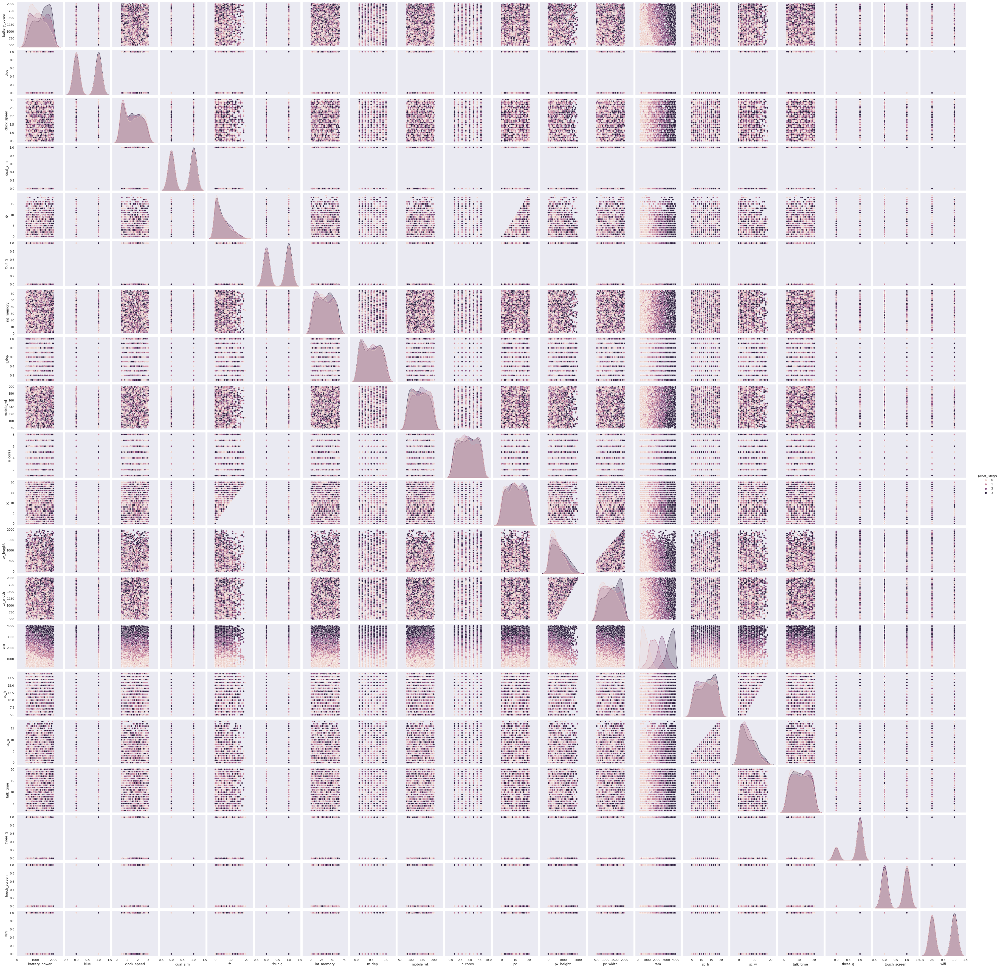

In [24]:
sns.pairplot(Mobile_df,hue='price_range')

#### touch screen, mobile_wt, clock_speed don't affect on price range


# Creating & Training Decision Trees Model


In [25]:
X=Mobile_df.drop(columns=['price_range','touch_screen','mobile_wt','clock_speed'])
Y=Mobile_df['price_range']

In [26]:
# Splitting the data

X_train, X_test, Y_train, Y_test = train_test_split(X,Y, test_size = 0.3 ,random_state = 0)

##  use gini

In [27]:
## Modeling
clf_Trees = DecisionTreeClassifier(max_depth = 15)
clf_Trees = clf_Trees.fit(X_train,Y_train )
y_pred = clf_Trees.predict(X_test)

In [28]:
print("Accuracy: ", metrics.accuracy_score(Y_test, y_pred))

Accuracy:  0.8366666666666667


In [29]:
confusion_matrix(Y, clf_Trees.predict(X))

array([[482,  18,   0,   0],
       [ 12, 473,  15,   0],
       [  0,  16, 466,  18],
       [  0,   0,  19, 481]])

In [30]:
## classification_report
print(classification_report(Y, clf_Trees.predict(X)))

              precision    recall  f1-score   support

           0       0.98      0.96      0.97       500
           1       0.93      0.95      0.94       500
           2       0.93      0.93      0.93       500
           3       0.96      0.96      0.96       500

    accuracy                           0.95      2000
   macro avg       0.95      0.95      0.95      2000
weighted avg       0.95      0.95      0.95      2000



In [31]:
text_representation = tree.export_text(clf_Trees)
print(text_representation)

|--- feature_11 <= 2235.50
|   |--- feature_11 <= 1175.50
|   |   |--- feature_9 <= 1449.00
|   |   |   |--- feature_0 <= 1816.50
|   |   |   |   |--- feature_11 <= 1052.50
|   |   |   |   |   |--- feature_5 <= 63.50
|   |   |   |   |   |   |--- feature_14 <= 19.50
|   |   |   |   |   |   |   |--- feature_10 <= 1976.50
|   |   |   |   |   |   |   |   |--- feature_14 <= 2.50
|   |   |   |   |   |   |   |   |   |--- feature_10 <= 1327.00
|   |   |   |   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |   |   |   |   |--- feature_10 >  1327.00
|   |   |   |   |   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |   |   |   |--- feature_14 >  2.50
|   |   |   |   |   |   |   |   |   |--- feature_0 <= 1504.00
|   |   |   |   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |   |   |   |   |--- feature_0 >  1504.00
|   |   |   |   |   |   |   |   |   |   |--- feature_0 <= 1511.00
|   |   |   |   |   |   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |   |   |  

###  use entropy

In [32]:
## Model 
clf_Trees = DecisionTreeClassifier(criterion = "entropy",max_depth = 15)
clf_Trees = clf_Trees.fit(X_train,Y_train )
y_pred = clf_Trees.predict(X_test)

In [33]:
print("Accuracy: ", metrics.accuracy_score(Y_test, y_pred))

Accuracy:  0.8383333333333334


## Price prediction of Test.csv Using Decision Trees for Prediction

In [34]:
## Import Data
data_test=pd.read_csv('../input/test-mobile-dataset/test.csv')

In [35]:
data_test.head()

,id,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,...,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi
0,1,1043,1,1.8,1,14,0,5,0.1,193,...,16,226,1412,3476,12,7,2,0,1,0
1,2,841,1,0.5,1,4,1,61,0.8,191,...,12,746,857,3895,6,0,7,1,0,0
2,3,1807,1,2.8,0,1,0,27,0.9,186,...,4,1270,1366,2396,17,10,10,0,1,1
3,4,1546,0,0.5,1,18,1,25,0.5,96,...,20,295,1752,3893,10,0,7,1,1,0
4,5,1434,0,1.4,0,11,1,49,0.5,108,...,18,749,810,1773,15,8,7,1,0,1


In [36]:
## Remove Id Columns
data_test=data_test.drop('id',axis=1)

In [37]:
## Predict Price
predicted_price=clf_Trees.predict(data_test.drop(columns=['touch_screen','mobile_wt','clock_speed']))

In [38]:
predicted_price

array([2, 3, 2, 3, 1, 3, 3, 1, 3, 0, 3, 3, 0, 0, 2, 0, 2, 1, 3, 2, 0, 3,
       2, 1, 3, 0, 2, 0, 3, 0, 2, 0, 3, 0, 0, 1, 3, 1, 2, 1, 1, 2, 0, 0,
       0, 1, 0, 3, 1, 2, 1, 0, 2, 0, 3, 1, 3, 1, 1, 3, 3, 2, 0, 2, 1, 1,
       1, 3, 1, 1, 1, 2, 2, 3, 3, 0, 2, 0, 2, 3, 1, 3, 3, 0, 3, 0, 3, 1,
       3, 0, 1, 2, 2, 0, 2, 2, 1, 2, 1, 2, 1, 0, 0, 3, 0, 2, 0, 1, 2, 3,
       3, 2, 1, 3, 3, 3, 3, 2, 3, 0, 0, 3, 1, 1, 2, 0, 3, 2, 3, 2, 0, 2,
       1, 1, 3, 0, 2, 0, 3, 2, 1, 3, 1, 2, 2, 3, 3, 3, 2, 3, 2, 3, 0, 0,
       3, 2, 3, 3, 3, 3, 3, 2, 3, 3, 3, 3, 1, 0, 3, 0, 0, 0, 2, 1, 0, 1,
       1, 1, 1, 2, 0, 0, 0, 0, 1, 3, 2, 1, 0, 0, 0, 1, 0, 3, 2, 1, 2, 1,
       2, 3, 1, 2, 3, 3, 3, 2, 2, 1, 0, 0, 1, 2, 0, 3, 3, 3, 0, 2, 0, 3,
       2, 2, 3, 0, 0, 1, 0, 3, 0, 1, 0, 2, 2, 1, 2, 1, 2, 0, 3, 1, 2, 0,
       0, 2, 1, 3, 3, 3, 2, 1, 3, 0, 0, 3, 3, 3, 1, 3, 1, 1, 3, 2, 1, 2,
       3, 3, 3, 1, 0, 0, 2, 3, 1, 1, 3, 2, 0, 3, 0, 1, 2, 1, 0, 3, 3, 3,
       3, 2, 1, 3, 3, 2, 3, 2, 3, 1, 2, 0, 3, 3, 1,

In [39]:
data_test_Decision_Trees = data_test.copy()

In [40]:
## Add predicted_price columns to data_test
data_test_Decision_Trees['price_range']=predicted_price
data_test_Decision_Trees

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,1043,1,1.8,1,14,0,5,0.1,193,3,...,226,1412,3476,12,7,2,0,1,0,2
1,841,1,0.5,1,4,1,61,0.8,191,5,...,746,857,3895,6,0,7,1,0,0,3
2,1807,1,2.8,0,1,0,27,0.9,186,3,...,1270,1366,2396,17,10,10,0,1,1,2
3,1546,0,0.5,1,18,1,25,0.5,96,8,...,295,1752,3893,10,0,7,1,1,0,3
4,1434,0,1.4,0,11,1,49,0.5,108,6,...,749,810,1773,15,8,7,1,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,1700,1,1.9,0,0,1,54,0.5,170,7,...,644,913,2121,14,8,15,1,1,0,1
996,609,0,1.8,1,0,0,13,0.9,186,4,...,1152,1632,1933,8,1,19,0,1,1,2
997,1185,0,1.4,0,1,1,8,0.5,80,1,...,477,825,1223,5,0,14,1,0,0,1
998,1533,1,0.5,1,0,0,50,0.4,171,2,...,38,832,2509,15,11,6,0,1,0,2


## Creating & Training Random Forest Model


In [41]:
X1=Mobile_df.drop(columns=['price_range','touch_screen','mobile_wt','clock_speed'])
Y1=Mobile_df['price_range']

In [42]:
# Splitting the data

X_train, X_test, Y_train, Y_test = train_test_split(X1,Y1, test_size = 0.3 ,random_state = 1)

In [43]:
## Model
clf_Forest  = RandomForestClassifier(n_estimators = 120,max_depth = 16)
clf_Forest= clf_Forest.fit(X_train,Y_train )
y_pred = clf_Forest.predict(X_test)

In [44]:
confusion_matrix(Y, clf_Forest.predict(X))

array([[491,   9,   0,   0],
       [ 13, 472,  15,   0],
       [  0,  16, 473,  11],
       [  0,   0,  11, 489]])

In [45]:
### Classification report
print(classification_report(Y, clf_Forest.predict(X)))

              precision    recall  f1-score   support

           0       0.97      0.98      0.98       500
           1       0.95      0.94      0.95       500
           2       0.95      0.95      0.95       500
           3       0.98      0.98      0.98       500

    accuracy                           0.96      2000
   macro avg       0.96      0.96      0.96      2000
weighted avg       0.96      0.96      0.96      2000



In [46]:
print("Accuracy: ", metrics.accuracy_score(Y_test, y_pred))

Accuracy:  0.875


### Price prediction of Test.csv Using Random Forest  for Prediction

In [47]:

predicted_price2=clf_Forest.predict(data_test.drop(columns=['touch_screen','mobile_wt','clock_speed']))

In [48]:
predicted_price2

array([3, 3, 2, 3, 1, 3, 3, 1, 3, 0, 3, 3, 0, 0, 2, 0, 2, 1, 3, 2, 1, 3,
       1, 1, 3, 0, 2, 0, 3, 0, 2, 0, 3, 0, 1, 1, 3, 1, 2, 1, 1, 2, 0, 0,
       0, 1, 0, 3, 1, 2, 2, 0, 3, 0, 3, 1, 3, 1, 1, 3, 3, 3, 0, 2, 0, 1,
       1, 3, 1, 1, 1, 2, 2, 3, 3, 0, 2, 0, 2, 3, 0, 3, 3, 0, 3, 0, 3, 1,
       3, 0, 1, 2, 2, 1, 2, 1, 0, 2, 1, 2, 1, 0, 0, 3, 1, 2, 0, 1, 2, 3,
       3, 2, 1, 3, 3, 3, 3, 1, 3, 0, 0, 3, 2, 1, 2, 0, 3, 2, 3, 1, 0, 1,
       1, 1, 3, 1, 2, 0, 3, 2, 1, 3, 1, 2, 3, 3, 3, 2, 2, 3, 2, 3, 0, 0,
       2, 2, 3, 3, 3, 3, 2, 2, 3, 3, 3, 3, 1, 0, 3, 0, 0, 0, 1, 1, 0, 1,
       0, 0, 1, 2, 0, 0, 0, 1, 2, 2, 2, 1, 0, 0, 0, 1, 0, 3, 1, 0, 2, 2,
       2, 3, 1, 2, 3, 3, 3, 1, 2, 1, 0, 0, 1, 3, 0, 2, 3, 3, 0, 2, 0, 3,
       2, 2, 3, 0, 0, 1, 0, 3, 0, 1, 0, 2, 2, 1, 2, 0, 3, 0, 3, 1, 2, 0,
       0, 2, 1, 2, 3, 3, 1, 1, 3, 0, 0, 2, 3, 3, 1, 3, 1, 1, 3, 2, 1, 2,
       3, 3, 3, 1, 0, 1, 1, 3, 1, 1, 3, 2, 0, 3, 0, 1, 2, 0, 0, 3, 2, 3,
       2, 2, 1, 3, 3, 2, 3, 2, 2, 1, 1, 0, 2, 3, 1,

In [49]:
data_test_Random_Forest = data_test.copy()

In [50]:
## Add predicted_price2 columns to data_test
data_test_Random_Forest['price_range']=predicted_price2
data_test_Random_Forest

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,1043,1,1.8,1,14,0,5,0.1,193,3,...,226,1412,3476,12,7,2,0,1,0,3
1,841,1,0.5,1,4,1,61,0.8,191,5,...,746,857,3895,6,0,7,1,0,0,3
2,1807,1,2.8,0,1,0,27,0.9,186,3,...,1270,1366,2396,17,10,10,0,1,1,2
3,1546,0,0.5,1,18,1,25,0.5,96,8,...,295,1752,3893,10,0,7,1,1,0,3
4,1434,0,1.4,0,11,1,49,0.5,108,6,...,749,810,1773,15,8,7,1,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,1700,1,1.9,0,0,1,54,0.5,170,7,...,644,913,2121,14,8,15,1,1,0,2
996,609,0,1.8,1,0,0,13,0.9,186,4,...,1152,1632,1933,8,1,19,0,1,1,1
997,1185,0,1.4,0,1,1,8,0.5,80,1,...,477,825,1223,5,0,14,1,0,0,0
998,1533,1,0.5,1,0,0,50,0.4,171,2,...,38,832,2509,15,11,6,0,1,0,2


### Creating & Training SVM Model


In [51]:
X2=Mobile_df.drop(columns=['price_range','touch_screen','mobile_wt','clock_speed'])
Y2=Mobile_df['price_range']

In [52]:
# Splitting the data

X_train, X_test, Y_train, Y_test = train_test_split(X2,Y2, test_size = 0.25)

In [53]:
#Model
clf_svm = SVC(C=100.0) 
clf_svm = clf_svm.fit(X_train,Y_train )
y_pred = clf_svm.predict(X_test)

In [54]:
print("Accuracy: ", metrics.accuracy_score(Y_test, y_pred))

Accuracy:  0.958


In [55]:
confusion_matrix(Y, clf_svm.predict(X))

array([[490,  10,   0,   0],
       [  5, 485,  10,   0],
       [  0,  15, 464,  21],
       [  0,   0,  16, 484]])

In [56]:
## Classification report
print(classification_report(Y, clf_svm.predict(X)))

              precision    recall  f1-score   support

           0       0.99      0.98      0.98       500
           1       0.95      0.97      0.96       500
           2       0.95      0.93      0.94       500
           3       0.96      0.97      0.96       500

    accuracy                           0.96      2000
   macro avg       0.96      0.96      0.96      2000
weighted avg       0.96      0.96      0.96      2000



### Price prediction of Test.csv Using SVM  for Prediction

In [57]:
predicted_price3=clf_svm.predict(data_test.drop(columns=['touch_screen','mobile_wt','clock_speed']))

In [58]:
predicted_price3

array([3, 3, 2, 3, 1, 3, 3, 1, 3, 0, 3, 3, 0, 0, 2, 0, 2, 1, 3, 2, 1, 3,
       1, 1, 3, 0, 2, 0, 3, 0, 2, 0, 3, 0, 1, 1, 3, 1, 2, 1, 1, 2, 0, 0,
       0, 1, 0, 3, 1, 2, 1, 0, 3, 0, 3, 1, 3, 1, 1, 3, 3, 2, 0, 1, 1, 1,
       2, 3, 1, 2, 1, 2, 2, 3, 3, 0, 2, 0, 2, 3, 0, 3, 3, 0, 3, 0, 3, 1,
       3, 0, 1, 2, 2, 0, 2, 2, 0, 2, 1, 2, 1, 0, 0, 3, 0, 2, 0, 1, 2, 3,
       3, 3, 1, 3, 3, 3, 3, 2, 3, 0, 0, 3, 2, 1, 2, 0, 3, 2, 3, 2, 0, 2,
       2, 1, 3, 1, 1, 0, 3, 2, 1, 2, 1, 2, 2, 3, 3, 2, 2, 3, 2, 3, 1, 0,
       3, 2, 3, 3, 3, 3, 2, 2, 3, 3, 3, 3, 1, 0, 3, 0, 0, 0, 2, 1, 0, 1,
       0, 0, 1, 2, 1, 0, 0, 1, 1, 2, 2, 1, 0, 0, 0, 1, 0, 3, 1, 0, 2, 2,
       3, 3, 1, 1, 3, 2, 3, 2, 2, 1, 0, 0, 1, 3, 0, 2, 3, 3, 0, 2, 0, 3,
       2, 3, 3, 1, 0, 1, 0, 3, 0, 1, 0, 2, 2, 1, 2, 1, 3, 0, 3, 1, 2, 0,
       0, 2, 1, 3, 3, 3, 1, 1, 3, 0, 0, 2, 3, 3, 1, 3, 1, 1, 3, 2, 1, 2,
       3, 3, 3, 1, 0, 0, 2, 3, 1, 1, 3, 2, 0, 3, 0, 0, 2, 1, 0, 3, 2, 3,
       3, 2, 1, 3, 3, 2, 3, 1, 2, 1, 2, 0, 2, 3, 1,

In [59]:
data_test_SVM = data_test.copy()

In [60]:
data_test_SVM['price_range']=predicted_price3
data_test_SVM

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,1043,1,1.8,1,14,0,5,0.1,193,3,...,226,1412,3476,12,7,2,0,1,0,3
1,841,1,0.5,1,4,1,61,0.8,191,5,...,746,857,3895,6,0,7,1,0,0,3
2,1807,1,2.8,0,1,0,27,0.9,186,3,...,1270,1366,2396,17,10,10,0,1,1,2
3,1546,0,0.5,1,18,1,25,0.5,96,8,...,295,1752,3893,10,0,7,1,1,0,3
4,1434,0,1.4,0,11,1,49,0.5,108,6,...,749,810,1773,15,8,7,1,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,1700,1,1.9,0,0,1,54,0.5,170,7,...,644,913,2121,14,8,15,1,1,0,2
996,609,0,1.8,1,0,0,13,0.9,186,4,...,1152,1632,1933,8,1,19,0,1,1,1
997,1185,0,1.4,0,1,1,8,0.5,80,1,...,477,825,1223,5,0,14,1,0,0,0
998,1533,1,0.5,1,0,0,50,0.4,171,2,...,38,832,2509,15,11,6,0,1,0,2


Conclusion:Best Algorithm is SVM

Decision Trees Accuracy: 0.835
    
Random Forest Accuracy: 0.865
    
SVM Accuracy: 0.962